In [1]:
!pip install nltk emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 35.1 MB/s eta 0:00:00


In [2]:
#Adding necessary imports and libraries
import emoji
import string
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk import pos_tag
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from pathlib import Path
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support
)

In [3]:
#Downloads the Natural Language Toolkit (NLTK) library for helping in text preprocessing
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [4]:
class TextPreProcessor: #Defining the preprocessor function
    def __init__(self, custom_stopwords = None):
        self.lemmatizer = WordNetLemmatizer()
        self.stop_words = set(stopwords.words('english'))
        if custom_stopwords:
            self.stop_words.update(custom_stopwords)

    def _get_wordnet_pos(self, word): #Assigns a part of speech (PoS) label to each word to help in lemmatization and help reducing it to its root form
        tag = pos_tag([word])[0][1][0].upper()
        tag_dict = {
            'J': wordnet.ADJ,
            'N': wordnet.NOUN,
            'V': wordnet.VERB,
            'R': wordnet.ADV
        }
        return tag_dict.get(tag, wordnet.NOUN)

    def preprocess(self, text):
        if not isinstance(text, str):
            return ""

        text = text.lower() #converts each text to lowercase for standardisation
        text = emoji.demojize(text) #removes emojis and converts them to their text representation
        text = text.translate(str.maketrans('', '', string.punctuation)) #removes punctuation
        tokens = word_tokenize(text)
        filtered_tokens = [] #filters, lemmatizes and rejoins the tokens to make the clean text
        for token in tokens:
            if token not in self.stop_words and token.isalpha():
                pos = self._get_wordnet_pos(token)
                lemma = self.lemmatizer.lemmatize(token, pos)
                filtered_tokens.append(lemma)

        return ' '.join(filtered_tokens)

    def preprocess_df(self, df, text_column):
        df_copy = df.copy()
        output_column = 'clean_text'
        df_copy[output_column] = df_copy[text_column].apply(self.preprocess)
        return df_copy

In [6]:
preproc = TextPreProcessor() #calls the preprocessing function
#takes the raw dataset and converts it into its final form with preprocessing, saving it in a folder called final

df = pd.read_csv("raw/borderlands.csv")
df_cleaned = preproc.preprocess_df(df, text_column='text')
df_cleaned.to_csv("final/borderlands.csv", index=False)

df = pd.read_csv("raw/airlines.csv")
df_cleaned = preproc.preprocess_df(df, text_column='text')
df_cleaned.to_csv("final/airlines.csv", index=False)

df = pd.read_csv("raw/climate.csv")
df_cleaned = preproc.preprocess_df(df, text_column='text')
df_cleaned.to_csv("final/climate.csv", index=False)

df = pd.read_csv("raw/corona.csv")
df_cleaned = preproc.preprocess_df(df, text_column='text')
df_cleaned.to_csv("final/corona.csv", index=False)

df = pd.read_csv("raw/combined.csv")
df_cleaned = preproc.preprocess_df(df, text_column='text')
df_cleaned.to_csv("final/combined.csv", index=False)

In [7]:
# exploratory data analysis for the airlines dataset
airlines_df = pd.read_csv("final/airlines.csv")

print("First 5 rows of the dataframe:")
display(airlines_df.head())

print("\nInfo about the dataframe:")
airlines_df.info()

print("\nDescription of the dataframe:")
display(airlines_df.describe())

print("\nMissing values per column:")
print(airlines_df.isnull().sum())

print("\nSentiment distribution:")
display(airlines_df['sentiment'].value_counts()) #prints number of data of each sentiment

plt.figure(figsize=(4, 4))
sns.countplot(x='sentiment', data=airlines_df)
plt.title('Distribution of Sentiments in Airlines Dataset')
plt.xlabel('Sentiment')
plt.ylabel('Count')

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'airlines_sentiment_distribution.png', dpi=150)
else:
    plt.show()

plt.close()

#word clouds for positive and negative sentiment distribution
from wordcloud import WordCloud

positive_text = " ".join(airlines_df[airlines_df['sentiment'] == 'positive']['clean_text'])
negative_text = " ".join(airlines_df[airlines_df['sentiment'] == 'negative']['clean_text'])

wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment')
plt.axis('off')

plt.tight_layout()

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'airlines_wordclouds.png', dpi=150)
else:
    plt.show()

plt.close()

First 5 rows of the dataframe:


,sentiment,text,clean_text
0,neutral,@VirginAmerica What @dhepburn said.,virginamerica dhepburn say
1,positive,@VirginAmerica plus you've added commercials t...,virginamerica plus youve add commercial experi...
2,neutral,@VirginAmerica I didn't today... Must mean I n...,virginamerica didnt today must mean need take ...
3,negative,@VirginAmerica it's really aggressive to blast...,virginamerica really aggressive blast obnoxiou...
4,negative,@VirginAmerica and it's a really big bad thing...,virginamerica really big bad thing



Info about the dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   sentiment   14640 non-null  object
 1   text        14640 non-null  object
 2   clean_text  14640 non-null  object
dtypes: object(3)
memory usage: 343.3+ KB

Description of the dataframe:


,sentiment,text,clean_text
count,14640,14640,14640
unique,3,14427,14238
top,negative,@united thanks,united thank
freq,9178,6,20



Missing values per column:
sentiment     0
text          0
clean_text    0
dtype: int64

Sentiment distribution:


,count
sentiment,
negative,9178
neutral,3099
positive,2363


In [8]:
# exploratory data analysis for climate dataset
climate_df = pd.read_csv("final/climate.csv")

print("First 5 rows of the dataframe:")
display(climate_df.head())

print("\nInfo about the dataframe:")
climate_df.info()

print("\nDescription of the dataframe:")
display(climate_df.describe())

print("\nMissing values per column:")
print(climate_df.isnull().sum())

print("\nSentiment distribution:")
display(climate_df['sentiment'].value_counts()) #prints number of data of each sentiment

plt.figure(figsize=(4, 4))
sns.countplot(x='sentiment', data=climate_df)
plt.title('Distribution of Sentiments in Climate Dataset')
plt.xlabel('Sentiment')
plt.ylabel('Count')

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'climate_sentiment_distribution.png', dpi=150)
else:
    plt.show()
plt.close()

# word clouds for positive and negative sentiment distribution
from wordcloud import WordCloud

positive_text = " ".join(climate_df[climate_df['sentiment'] == 'positive']['clean_text'].fillna(''))
negative_text = " ".join(climate_df[climate_df['sentiment'] == 'negative']['clean_text'].fillna(''))

wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment')
plt.axis('off')

plt.tight_layout()

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'climate_wordclouds.png', dpi=150)
else:
    plt.show()
plt.close()

First 5 rows of the dataframe:


,sentiment,text,clean_text
0,negative,@tiniebeany climate change is an interesting h...,tiniebeany climate change interest hustle glob...
1,positive,RT @NatGeoChannel: Watch #BeforeTheFlood right...,rt natgeochannel watch beforetheflood right le...
2,positive,Fabulous! Leonardo #DiCaprio's film on #climat...,fabulous leonardo dicaprios film climate chang...
3,positive,RT @Mick_Fanning: Just watched this amazing do...,rt mickfanning watch amaze documentary leonard...
4,neutral,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",rt cnalive pranita biswasi lutheran odisha giv...



Info about the dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43943 entries, 0 to 43942
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   sentiment   43943 non-null  object
 1   text        43943 non-null  object
 2   clean_text  43936 non-null  object
dtypes: object(3)
memory usage: 1.0+ MB

Description of the dataframe:


,sentiment,text,clean_text
count,43943,43943,43936
unique,3,41033,39849
top,positive,RT @StephenSchlegel: she's thinking about how ...,rt stephenschlegel shes think shes go die husb...
freq,22962,506,507



Missing values per column:
sentiment     0
text          0
clean_text    7
dtype: int64

Sentiment distribution:


,count
sentiment,
positive,22962
neutral,16991
negative,3990


In [9]:
# exploratory data analysis for the corona dataset
corona_df = pd.read_csv("final/corona.csv")

print("First 5 rows of the dataframe:")
display(corona_df.head())

print("\nInfo about the dataframe:")
corona_df.info()

print("\nDescription of the dataframe:")
display(corona_df.describe())

print("\nMissing values per column:")
print(corona_df.isnull().sum())

print("\nSentiment distribution:")
display(corona_df['sentiment'].value_counts()) #prints number of data of each sentiment

plt.figure(figsize=(4, 4))
sns.countplot(x='sentiment', data=corona_df)
plt.title('Distribution of Sentiments in Corona Dataset')
plt.xlabel('Sentiment')
plt.ylabel('Count')

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'corona_sentiment_distribution.png', dpi=150)
else:
    plt.show()
plt.close()

# word clouds for positive and negative sentiment distribution
from wordcloud import WordCloud

positive_text = " ".join(corona_df[corona_df['sentiment'] == 'positive']['clean_text'].fillna(''))
negative_text = " ".join(corona_df[corona_df['sentiment'] == 'negative']['clean_text'].fillna(''))

wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment')
plt.axis('off')

plt.tight_layout()

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'corona_wordclouds.png', dpi=150)
else:
    plt.show()
plt.close()

First 5 rows of the dataframe:


,text,sentiment,clean_text
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,neutral,menyrbie philgahan chrisitv
1,advice Talk to your neighbours family to excha...,positive,advice talk neighbour family exchange phone nu...
2,Coronavirus Australia: Woolworths to give elde...,positive,coronavirus australia woolworth give elderly d...
3,My food stock is not the only one which is emp...,positive,food stock one empty please dont panic enough ...
4,"Me, ready to go at supermarket during the #COV...",negative,ready go supermarket outbreak im paranoid food...



Info about the dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44955 entries, 0 to 44954
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   text        44955 non-null  object
 1   sentiment   44955 non-null  object
 2   clean_text  44936 non-null  object
dtypes: object(3)
memory usage: 1.0+ MB

Description of the dataframe:


,text,sentiment,clean_text
count,44955,44955,44936
unique,44955,3,44773
top,I and @ForestandPaper members are committed to...,positive,online shopping way restriction
freq,1,19592,6



Missing values per column:
text           0
sentiment      0
clean_text    19
dtype: int64

Sentiment distribution:


,count
sentiment,
positive,19592
negative,17031
neutral,8332


In [10]:
#exploratory data analysis for borderlands dataset
borderlands_df = pd.read_csv("final/borderlands.csv")

print("First 5 rows of the dataframe:")
display(borderlands_df.head())

print("\nInfo about the dataframe:")
borderlands_df.info()

print("\nDescription of the dataframe:")
display(borderlands_df.describe())

print("\nMissing values per column:")
print(borderlands_df.isnull().sum())

print("\nSentiment distribution:")
display(borderlands_df['sentiment'].value_counts()) #prints number of data of each sentiment

plt.figure(figsize=(4, 4))
sns.countplot(x='sentiment', data=borderlands_df)
plt.title('Distribution of Sentiments in Borderlands Dataset')
plt.xlabel('Sentiment')
plt.ylabel('Count')

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'borderlands_sentiment_distribution.png', dpi=150)
else:
    plt.show()
plt.close()

# word clouds for positive and negative sentiment distribution
from wordcloud import WordCloud

positive_text = " ".join(borderlands_df[borderlands_df['sentiment'] == 'positive']['clean_text'].fillna(''))
negative_text = " ".join(borderlands_df[borderlands_df['sentiment'] == 'negative']['clean_text'].fillna(''))

wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment')
plt.axis('off')

plt.tight_layout()

output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'borderlands_wordclouds.png', dpi=150)
else:
    plt.show()
plt.close()

First 5 rows of the dataframe:


,sentiment,text,clean_text
0,positive,im getting on borderlands and i will murder yo...,im get borderland murder
1,positive,I am coming to the borders and I will kill you...,come border kill
2,positive,im getting on borderlands and i will kill you ...,im get borderland kill
3,positive,im coming on borderlands and i will murder you...,im come borderland murder
4,positive,im getting on borderlands 2 and i will murder ...,im get borderland murder



Info about the dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73824 entries, 0 to 73823
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   sentiment   73824 non-null  object
 1   text        73824 non-null  object
 2   clean_text  72305 non-null  object
dtypes: object(3)
memory usage: 1.7+ MB

Description of the dataframe:


,sentiment,text,clean_text
count,73824,73824,72305
unique,3,69490,61192
top,neutral,"At the same time, despite the fact that there ...",unk
freq,30893,172,174



Missing values per column:
sentiment        0
text             0
clean_text    1519
dtype: int64

Sentiment distribution:


,count
sentiment,
neutral,30893
negative,22312
positive,20619


First 5 rows of the dataframe:


,sentiment,text,clean_text
0,positive,im getting on borderlands and i will murder yo...,im get borderland murder
1,positive,I am coming to the borders and I will kill you...,come border kill
2,positive,im getting on borderlands and i will kill you ...,im get borderland kill
3,positive,im coming on borderlands and i will murder you...,im come borderland murder
4,positive,im getting on borderlands 2 and i will murder ...,im get borderland murder



Info about the dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177362 entries, 0 to 177361
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   sentiment   177362 non-null  object
 1   text        177362 non-null  object
 2   clean_text  175817 non-null  object
dtypes: object(3)
memory usage: 4.1+ MB

Description of the dataframe:


,sentiment,text,clean_text
count,177362,177362,175817
unique,3,169905,160034
top,positive,RT @StephenSchlegel: she's thinking about how ...,rt stephenschlegel shes think shes go die husb...
freq,65536,506,507



Missing values per column:
sentiment        0
text             0
clean_text    1545
dtype: int64

Sentiment distribution:


,count
sentiment,
positive,65536
neutral,59315
negative,52511


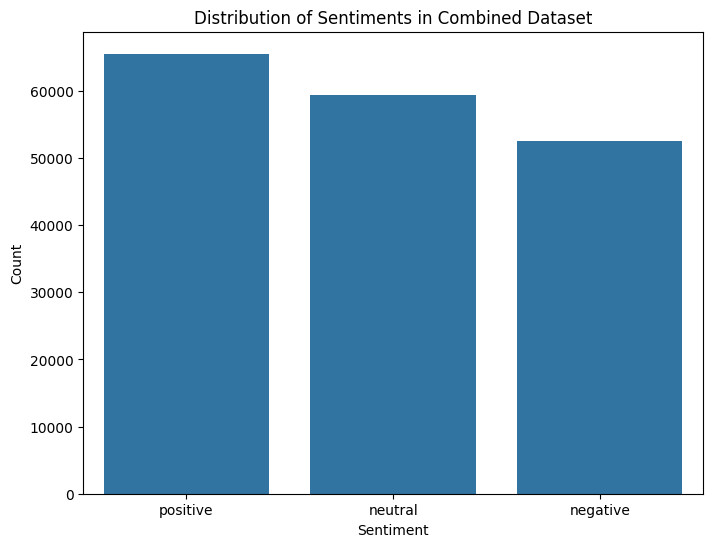

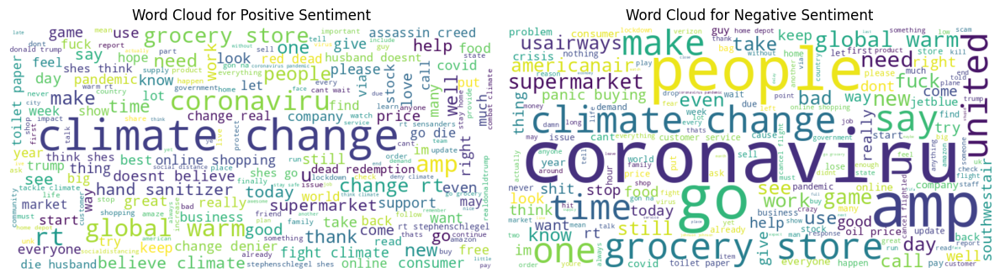

In [11]:
#exploratory data analysis for combined dataset which has all four datasets together
combined_df = pd.read_csv("final/combined.csv")

print("First 5 rows of the dataframe:")
display(combined_df.head())

print("\nInfo about the dataframe:")
combined_df.info()

print("\nDescription of the dataframe:")
display(combined_df.describe())

print("\nMissing values per column:")
print(combined_df.isnull().sum())

print("\nSentiment distribution:")
display(combined_df['sentiment'].value_counts()) #prints number of data of each sentiment

plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment', data=combined_df)
plt.title('Distribution of Sentiments in Combined Dataset')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

# word clouds for positive and negative sentiments distribution
from wordcloud import WordCloud

positive_text = " ".join(combined_df[combined_df['sentiment'] == 'positive']['clean_text'].fillna(''))
negative_text = " ".join(combined_df[combined_df['sentiment'] == 'negative']['clean_text'].fillna(''))

wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Sentiment')
plt.axis('off')

plt.tight_layout()
plt.show()

In [12]:
# baseline model: logistic regression + bag of words
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

class BaselineModel:
    def __init__(self, output_dir=None):
        if output_dir:
            self.output_dir = Path(output_dir)
            self.output_dir.mkdir(parents=True, exist_ok=True)
        else:
            self.output_dir = None

    def _prepare_features_and_target(self, df): #extracts clean text (features) and the predictor (sentiment)
        X = df['clean_text'].fillna('') #any NaNs as removed by the preprocessor are filled with empty text
        y = df['sentiment']
        return X, y

    def _split_data(self, X, y, test_size = 0.2, random_state = 42): #splitting data into training and testing data, 80%-20% respectively
        return train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y) #using stratify=y to ensure class balance is preserved during splitting

    def _create_bow_features(self, X_train, X_test, max_features = 5000): #creates bag of words, limiting max features to 5000 and thus taking the vocabulary as max 5000 most frequent words
        vectorizer = CountVectorizer(max_features=max_features, stop_words='english') #removing all common stop words that are in English
        X_train_vec = vectorizer.fit_transform(X_train)
        X_test_vec = vectorizer.transform(X_test)
        return X_train_vec, X_test_vec, vectorizer

    def _train_logreg(self, X_train_vec, y_train): #training our logistic regression model
        model = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced') #class weight is balanced so as to ensure no skewing of the dataset in case of imbalance
        model.fit(X_train_vec, y_train)
        return model

    def _evaluate(self, model, X_test_vec, y_test): #collecting performance metrics, using weighted averages due to skewed dataset
        y_pred = model.predict(X_test_vec)
        precision, recall, f1, _ = precision_recall_fscore_support(
            y_test, y_pred, average='weighted', zero_division=0
        )

        return {
            'accuracy': accuracy_score(y_test, y_pred),
            'weighted_precision': precision,
            'weighted_recall': recall,
            'weighted_f1': f1,
            'classification_report': classification_report(y_test, y_pred, zero_division=0),
            'confusion_matrix': confusion_matrix(y_test, y_pred),
            'labels': sorted(y_test.unique())
        }

    def _plot_confusion_matrix(self, results, dataset_name): #plotting confusion matrix
        cm = results['confusion_matrix']
        labels = results['labels']

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=labels, yticklabels=labels)

        plt.title(f'Confusion Matrix: {dataset_name.title()}', fontsize=16)
        plt.ylabel('True Sentiment', fontsize=12)
        plt.xlabel('Predicted Sentiment', fontsize=12)
        plt.tight_layout()

        if self.output_dir:
            save_path = self.output_dir / f'{dataset_name}_basline_confusion_matrix.png'
            plt.savefig(save_path, dpi=150)
        else:
            plt.show()

        plt.close()

    def run(self, df, dataset_name): #workflow for the entire model
        X, y = self._prepare_features_and_target(df)
        X_train, X_test, y_train, y_test = self._split_data(X, y)
        X_train_vec, X_test_vec, vectorizer = self._create_bow_features(X_train, X_test)
        model = self._train_logreg(X_train_vec, y_train)
        results = self._evaluate(model, X_test_vec, y_test)
        self._plot_confusion_matrix(results, dataset_name)
        return {
            'model': model,
            'vectorizer': vectorizer,
            'results': results
        }

In [13]:
#runnning baseline model on all the cleaned files
cleaned_files = {
    'borderlands': 'final/borderlands.csv',
    'airlines': 'final/airlines.csv',
    'climate': 'final/climate.csv',
    'corona': 'final/corona.csv',
    'combined': 'final/combined.csv'
}

dataframes = {name: pd.read_csv(path) for name, path in cleaned_files.items()}
collected_results = {}
pipeline = BaselineModel("img")
for name, df in dataframes.items():
    output = pipeline.run(df, dataset_name=name)
    print(output['results']['classification_report'])
    collected_results[name] = output['results']


              precision    recall  f1-score   support

    negative       0.73      0.76      0.74      4462
     neutral       0.78      0.65      0.71      6179
    positive       0.65      0.78      0.71      4124

    accuracy                           0.72     14765
   macro avg       0.72      0.73      0.72     14765
weighted avg       0.73      0.72      0.72     14765

              precision    recall  f1-score   support

    negative       0.90      0.78      0.84      1835
     neutral       0.52      0.69      0.60       620
    positive       0.65      0.70      0.67       473

    accuracy                           0.75      2928
   macro avg       0.69      0.72      0.70      2928
weighted avg       0.78      0.75      0.76      2928

              precision    recall  f1-score   support

    negative       0.44      0.68      0.53       798
     neutral       0.68      0.70      0.69      3398
    positive       0.81      0.71      0.76      4593

    accuracy        

In [14]:
#summarising the results for each dataset from all the cleaned files
summary_data = []
for name, results in collected_results.items():
    summary_data.append({
        'Dataset': name.title(),
        'Accuracy': results['accuracy'],
        'Weighted F1-Score': results['weighted_f1'],
        'Weighted Precision': results.get('weighted_precision', 'N/A'),
        'Weighted Recall': results.get('weighted_recall', 'N/A')
    })

    summary_df = pd.DataFrame(summary_data)
    summary_df = summary_df.sort_values(by='Weighted F1-Score', ascending=False)
    summary_df.reset_index(drop=True, inplace=True)

display(summary_df)

,Dataset,Accuracy,Weighted F1-Score,Weighted Precision,Weighted Recall
0,Corona,0.769992,0.774208,0.785634,0.769992
1,Airlines,0.751025,0.760116,0.779097,0.751025
2,Borderlands,0.719946,0.719803,0.727534,0.719946
3,Climate,0.705200,0.711185,0.725310,0.705200
4,Combined,0.663913,0.664074,0.665370,0.663913


In [15]:
# trial clustering baseline: using an unsupervised model to try and find an underlying structure, uses K-Means

class ClusteringModel:
    def __init__(self, output_dir=None, n_clusters=3):
        if output_dir:
            self.output_dir = Path(output_dir)
            self.output_dir.mkdir(parents=True, exist_ok=True)
        else:
            self.output_dir = None
        self.n_clusters = n_clusters

    def _prepare_features(self, df):
        X = df['clean_text'].fillna('')
        return X

    def _create_tfidf_features(self, X, max_features=5000):
        vectorizer = CountVectorizer(max_features=max_features, stop_words='english', max_df=0.95, min_df=2)
        X_vec = vectorizer.fit_transform(X)
        return X_vec, vectorizer

    def _fit_kmeans(self, X_vec):
        model = KMeans(n_clusters=self.n_clusters, random_state=42, n_init=10) #k-means cluster algorithm being used
        model.fit(X_vec)
        return model

    def _evaluate(self, X_vec, labels):
        score = np.nan
        if len(np.unique(labels)) > 1:
            score = silhouette_score(X_vec, labels)
        return {'silhouette_score': score} #evaluating clustering ability using silhouette-score, nearer to +1 meaning dense and well separated vectors, whereas 0 implying overlap. -1 shows mislabelling by the clusters

    def run(self, df, dataset_name): #workflow for the entire model
        X = self._prepare_features(df)
        X_vec, vectorizer = self._create_tfidf_features(X)
        model = self._fit_kmeans(X_vec)
        results = self._evaluate(X_vec, model.labels_)

        cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
        cluster_data = {'labels': cluster_labels.tolist(), 'counts': cluster_counts.tolist()}

        print(f"Results for {dataset_name.title()}: Silhouette Score = {results['silhouette_score']:.4f}")

        return {
            'model': model,
            'vectorizer': vectorizer,
            'results': results,
            'cluster_data': cluster_data
        }

#running the main script to work on the preprocessed data

cleaned_files = {
    'borderlands': 'final/borderlands.csv',
    'airlines': 'final/airlines.csv',
    'climate': 'final/climate.csv',
    'corona': 'final/corona.csv',
    'combined': 'final/combined.csv'
}

dataframes = {name: pd.read_csv(path) for name, path in cleaned_files.items()}
collected_results = {}
pipeline = ClusteringModel()
for name, df in dataframes.items():
    output = pipeline.run(df, dataset_name=name)
    collected_results[name] = output['results']
summary_data = []
for name, results in collected_results.items():
    summary_data.append({
        'Dataset': name.title(),
        'Silhouette score': results['silhouette_score'],
    })

    summary_df = pd.DataFrame(summary_data)
    summary_df = summary_df.sort_values(by='Silhouette score', ascending=False)
    summary_df.reset_index(drop=True, inplace=True)

display(summary_df) #showing the final summary table

Results for Borderlands: Silhouette Score = 0.1330
Results for Airlines: Silhouette Score = 0.0412
Results for Climate: Silhouette Score = 0.0524
Results for Corona: Silhouette Score = 0.0223
Results for Combined: Silhouette Score = 0.0151


,Dataset,Silhouette score
0,Borderlands,0.133004
1,Climate,0.052418
2,Airlines,0.041206
3,Corona,0.022346
4,Combined,0.015057


In [16]:
# intermediate model: training Naive-Bayes and Linear Support Vector Classifier using TF-IDF (Term Frequency-Inverse Document Frequency) features with 1-grams and 2-grams

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
class IntermediateModel:
    def __init__(self, output_dir = None):
        if output_dir:
            self.output_dir = Path(output_dir)
            self.output_dir.mkdir(parents=True, exist_ok=True)
        else:
            self.output_dir = None

    def _prepare_features_and_target(self, df): #extracting features and the target from the cleaned dataset
        X = df['clean_text'].fillna('')
        y = df['sentiment']
        return X, y

    def _split_data(self, X, y, test_size = 0.2, random_state = 42): #splitting data into training and testing data, 80%-20% respectively
        return train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y) #using stratify=y to ensure class balance is preserved during splitting

    def _create_tfidf_features(self, X_train, X_test): #using TF-IDF instead of CountVectorizer as we used previously in the baseline model
        vectorizer = TfidfVectorizer(
            max_features=17000, #limits vocabulary to top 17,000 most frequent features
            ngram_range=(1, 2), #uses n-grams here, both single words and two word phrases so as to learn how two words can change the meaning (eg: 'good' and 'not good')
        )
        X_train_vec = vectorizer.fit_transform(X_train)
        X_test_vec = vectorizer.transform(X_test)
        return X_train_vec, X_test_vec, vectorizer

    def _train_model(self, model_name, X_train_vec, y_train):
        if model_name.lower() == 'nb': #training the Naive-Nayes model
            model = MultinomialNB(alpha=1.0)
        elif model_name.lower() == 'svm': #training linear SVM model
            model = LinearSVC(C=1.0, class_weight='balanced', max_iter=2000, random_state=42)
        else:
            raise ValueError("bruh")

        model.fit(X_train_vec, y_train)
        return model

    def _evaluate_model(self, model, X_test_vec, y_test): #collecting both the model's performance metrics
        y_pred = model.predict(X_test_vec)
        precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted', zero_division=0)
        return {
            'accuracy': accuracy_score(y_test, y_pred),
            'weighted_precision': precision,
            'weighted_recall': recall,
            'weighted_f1': f1,
            'classification_report': classification_report(y_test, y_pred, zero_division=0),
            'confusion_matrix': confusion_matrix(y_test, y_pred),
            'labels': sorted(y_test.unique())
        }

    def _plot_confusion_matrix(self, results, model_name, dataset_name): #plotting confusion matrix for the given model
        plt.figure(figsize=(8, 6))
        sns.heatmap(results['confusion_matrix'], annot=True, fmt='d', cmap='viridis',
                    xticklabels=results['labels'], yticklabels=results['labels'])
        plt.title(f'Confusion Matrix: {model_name} on {dataset_name.title()}', fontsize=16)
        plt.ylabel('True Sentiment', fontsize=12)
        plt.xlabel('Predicted Sentiment', fontsize=12)
        plt.tight_layout()

        if self.output_dir:
            plot_path = self.output_dir / f'{dataset_name}_{model_name}_cm.png'
            plot_path.parent.mkdir(parents=True, exist_ok=True)
            plt.savefig(plot_path, dpi=150)
        else:
            plt.show()
        plt.close()

    def run(self, df, dataset_name) -> dict: #workflow for the entire model
        X, y = self._prepare_features_and_target(df)
        X_train, X_test, y_train, y_test = self._split_data(X, y)
        X_train_vec, X_test_vec, vectorizer = self._create_tfidf_features(X_train, X_test)

        all_model_results = {}

        for model_name_short, model_name_full in [('nb', 'Naive Bayes'), ('svm', 'SVM')]:
            print(f"\n--- Training {model_name_full} Model ---")
            model = self._train_model(model_name_short, X_train_vec, y_train)
            results = self._evaluate_model(model, X_test_vec, y_test)

            print(f"--- Results for {model_name_full} ---")
            print(results['classification_report'])
            self._plot_confusion_matrix(results, model_name_full, dataset_name)

            all_model_results[model_name_short] = {
                'model': model,
                'vectorizer': vectorizer,
                'results': results
            }

        return all_model_results

In [17]:
#using the intermediate model for the final, preprocessed data and collecting its results
cleaned_files = {
    'borderlands': 'final/borderlands.csv',
    'airlines': 'final/airlines.csv',
    'climate': 'final/climate.csv',
    'corona': 'final/corona.csv',
    'combined': 'final/combined.csv'
}

dataframes = {name: pd.read_csv(path) for name, path in cleaned_files.items()}
collected_results = {}
pipeline = IntermediateModel("img")
for name, df in dataframes.items():
    output = pipeline.run(df, dataset_name=name)
    print(output['nb']['results']['classification_report'])
    print(output['svm']['results']['classification_report'])
    collected_results[name] = output


--- Training Naive Bayes Model ---
--- Results for Naive Bayes ---
              precision    recall  f1-score   support

    negative       0.79      0.73      0.76      4462
     neutral       0.71      0.82      0.76      6179
    positive       0.78      0.67      0.72      4124

    accuracy                           0.75     14765
   macro avg       0.76      0.74      0.75     14765
weighted avg       0.76      0.75      0.75     14765


--- Training SVM Model ---
--- Results for SVM ---
              precision    recall  f1-score   support

    negative       0.85      0.85      0.85      4462
     neutral       0.84      0.84      0.84      6179
    positive       0.82      0.82      0.82      4124

    accuracy                           0.84     14765
   macro avg       0.84      0.84      0.84     14765
weighted avg       0.84      0.84      0.84     14765

              precision    recall  f1-score   support

    negative       0.79      0.73      0.76      4462
     neut

In [18]:
summary_data = [] #summarising all the data from the different models collected

for name, output in collected_results.items():
    for key, data in output.items():
        results = data['results']

        summary_data.append({
            'Dataset': name.title(),
            'Model': 'Naive Bayes' if key == 'nb' else 'SVM',
            'Accuracy': results['accuracy'],
            'Weighted F1-Score': results['weighted_f1'],
            'Weighted Precision': results['weighted_precision'],
            'Weighted Recall': results['weighted_recall'],
        })
summary_df = pd.DataFrame(summary_data, columns=['Dataset', 'Model', 'Accuracy', 'Weighted F1-Score', 'Weighted Precision', 'Weighted Recall'])
summary_df = summary_df.sort_values(by=['Dataset', 'Weighted F1-Score'], ascending=[True, False])
summary_df.reset_index(drop=True, inplace=True)

display(summary_df)

,Dataset,Model,Accuracy,Weighted F1-Score,Weighted Precision,Weighted Recall
0,Airlines,SVM,0.785519,0.784312,0.783599,0.785519
1,Airlines,Naive Bayes,0.706626,0.641589,0.740976,0.706626
2,Borderlands,SVM,0.836370,0.836358,0.836354,0.836370
3,Borderlands,Naive Bayes,0.751846,0.750891,0.756217,0.751846
4,Climate,SVM,0.741723,0.742131,0.742768,0.741723
5,Climate,Naive Bayes,0.719308,0.701848,0.731002,0.719308
6,Combined,SVM,0.708793,0.708354,0.708429,0.708793
7,Combined,Naive Bayes,0.657711,0.656099,0.656896,0.657711
8,Corona,SVM,0.782672,0.783510,0.784647,0.782672
9,Corona,Naive Bayes,0.658325,0.623386,0.675168,0.658325


In [19]:
#finding the best hyperparameter for SVM-tuning to test using GridSearchCV
param_grid = {
    'C': [0.1, 1, 10], #defining all the different regularisation parameters it is going to cycle through
    'penalty': ['l2'], # type of regularisation/penalties we are using to prevent overfitting, not using l1 here as it is not compatible with hinge-loss
    'loss': ['hinge', 'squared_hinge'], #loss function to calculate error of the model predictions
    'dual': [False]
}

In [20]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC


#tuning the SVM model for each dataset by going through each parameter as defined in the cell above and finding the highest score
tuned_results = {}

for name, df in dataframes.items():
    print(f"--- Tuning Linear SVC for {name.title()} Dataset ---")

    X, y = df['clean_text'].fillna(''), df['sentiment']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    vectorizer = TfidfVectorizer(max_features=17000, ngram_range=(1, 2))
    X_train_vec = vectorizer.fit_transform(X_train)
    X_test_vec = vectorizer.transform(X_test)

    lsvc = LinearSVC(random_state=42, class_weight='balanced')

    grid_search = GridSearchCV(estimator=lsvc, param_grid=param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)
    grid_search.fit(X_train_vec, y_train)

    tuned_results[name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_
    }

    print(f"Best parameters for {name.title()}: {grid_search.best_params_}")
    print(f"Best weighted F1-score for {name.title()}: {grid_search.best_score_:.4f}")

--- Tuning Linear SVC for Borderlands Dataset ---


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_it

Best parameters for Borderlands: {'C': 10, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}
Best weighted F1-score for Borderlands: 0.8373
--- Tuning Linear SVC for Airlines Dataset ---


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_it

Best parameters for Airlines: {'C': 0.1, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}
Best weighted F1-score for Airlines: 0.7799
--- Tuning Linear SVC for Climate Dataset ---


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_it

Best parameters for Climate: {'C': 0.1, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}
Best weighted F1-score for Climate: 0.7485
--- Tuning Linear SVC for Corona Dataset ---


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_it

Best parameters for Corona: {'C': 1, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}
Best weighted F1-score for Corona: 0.7758
--- Tuning Linear SVC for Combined Dataset ---


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_it

Best parameters for Combined: {'C': 1, 'dual': False, 'loss': 'squared_hinge', 'penalty': 'l2'}
Best weighted F1-score for Combined: 0.7024


In [21]:
evaluated_tuned_models = {}

for name, results in tuned_results.items():
    print(f"--- Evaluating Tuned Linear SVC for {name.title()} Dataset ---")
    best_params = results['best_params']

    df = dataframes[name]

    X = df['clean_text'].fillna('')     #preparing features for each dataset
    y = df['sentiment'] #taking the classification as well

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) #splitting data into training and testing data, 80%-20% respectively, using stratify=y to ensure class balance is preserved during splitting

    vectorizer = TfidfVectorizer(max_features=17000, ngram_range=(1, 2))
    X_train_vec = vectorizer.fit_transform(X_train)
    X_test_vec = vectorizer.transform(X_test)

    tuned_lsvc = LinearSVC(**best_params, random_state=42, class_weight='balanced') #instantiating and training the linear SVC model with the best hyperparameters
    tuned_lsvc.fit(X_train_vec, y_train)

    y_pred = tuned_lsvc.predict(X_test_vec)
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted', zero_division=0)

    evaluation_results = { #storing the evaluation results and metrics
        'accuracy': accuracy_score(y_test, y_pred),
        'weighted_precision': precision,
        'weighted_recall': recall,
        'weighted_f1': f1,
        'classification_report': classification_report(y_test, y_pred, zero_division=0),
        'confusion_matrix': confusion_matrix(y_test, y_pred),
        'labels': sorted(y_test.unique())
    }
    evaluated_tuned_models[name] = {'results': evaluation_results}

    print("Classification Report:")
    print(evaluation_results['classification_report'])

    # plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(evaluation_results['confusion_matrix'], annot=True, fmt='d', cmap='viridis',
                xticklabels=evaluation_results['labels'], yticklabels=evaluation_results['labels'])
    plt.title(f'Confusion Matrix: Tuned SVM on {name.title()}', fontsize=16)
    plt.ylabel('True Sentiment', fontsize=12)
    plt.xlabel('Predicted Sentiment', fontsize=12)
    plt.tight_layout()

    output_dir = Path("img")
    if output_dir:
        output_dir.mkdir(parents=True, exist_ok=True)
        plot_path = output_dir / f'{name}_tuned_svm_cm.png'
        plt.savefig(plot_path, dpi=150)
    else:
        plt.show()
    plt.close()


--- Evaluating Tuned Linear SVC for Borderlands Dataset ---
Classification Report:
              precision    recall  f1-score   support

    negative       0.86      0.84      0.85      4462
     neutral       0.84      0.85      0.84      6179
    positive       0.82      0.82      0.82      4124

    accuracy                           0.84     14765
   macro avg       0.84      0.84      0.84     14765
weighted avg       0.84      0.84      0.84     14765

--- Evaluating Tuned Linear SVC for Airlines Dataset ---
Classification Report:
              precision    recall  f1-score   support

    negative       0.85      0.89      0.87      1835
     neutral       0.63      0.59      0.61       620
    positive       0.74      0.66      0.70       473

    accuracy                           0.79      2928
   macro avg       0.74      0.71      0.73      2928
weighted avg       0.79      0.79      0.79      2928

--- Evaluating Tuned Linear SVC for Climate Dataset ---
Classification Repo

In [22]:
summary_data_tuned = [] #summarising all the findings fromthe tuned model

for name, output in evaluated_tuned_models.items():
    results = output['results']

    summary_data_tuned.append({
        'Dataset': name.title(),
        'Model': 'Tuned SVM',
        'Accuracy': results['accuracy'],
        'Weighted F1-Score': results['weighted_f1'],
        'Weighted Precision': results['weighted_precision'],
        'Weighted Recall': results['weighted_recall'],
    })

summary_df_tuned = pd.DataFrame(summary_data_tuned)
summary_df_tuned = summary_df_tuned.sort_values(by=['Dataset', 'Weighted F1-Score'], ascending=[True, False])
summary_df_tuned.reset_index(drop=True, inplace=True)

display(summary_df_tuned)

,Dataset,Model,Accuracy,Weighted F1-Score,Weighted Precision,Weighted Recall
0,Airlines,Tuned SVM,0.792008,0.788733,0.787126,0.792008
1,Borderlands,Tuned SVM,0.839214,0.839241,0.839368,0.839214
2,Climate,Tuned SVM,0.747184,0.746842,0.746818,0.747184
3,Combined,Tuned SVM,0.708793,0.708354,0.708429,0.708793
4,Corona,Tuned SVM,0.782672,0.783510,0.784647,0.782672


In [23]:
combined_summary_df = pd.concat([summary_df_tuned, summary_df])
combined_summary_df = combined_summary_df.sort_values(by=['Dataset', 'Weighted F1-Score'], ascending=[True, False])
combined_summary_df.reset_index(drop=True, inplace=True)
display(combined_summary_df)

,Dataset,Model,Accuracy,Weighted F1-Score,Weighted Precision,Weighted Recall
0,Airlines,Tuned SVM,0.792008,0.788733,0.787126,0.792008
1,Airlines,SVM,0.785519,0.784312,0.783599,0.785519
2,Airlines,Naive Bayes,0.706626,0.641589,0.740976,0.706626
3,Borderlands,Tuned SVM,0.839214,0.839241,0.839368,0.839214
4,Borderlands,SVM,0.836370,0.836358,0.836354,0.836370
5,Borderlands,Naive Bayes,0.751846,0.750891,0.756217,0.751846
6,Climate,Tuned SVM,0.747184,0.746842,0.746818,0.747184
7,Climate,SVM,0.741723,0.742131,0.742768,0.741723
8,Climate,Naive Bayes,0.719308,0.701848,0.731002,0.719308
9,Combined,Tuned SVM,0.708793,0.708354,0.708429,0.708793


In [24]:
# comparing all the performances by plotting different metrics together
print("Combined Performance Summary:")
display(combined_summary_df)

# weighted F1-Score
plt.figure(figsize=(12, 6))
sns.barplot(x='Dataset', y='Weighted F1-Score', hue='Model', data=combined_summary_df, palette='viridis')
plt.title('Weighted F1-Score Comparison by Dataset and Model', fontsize=16)
plt.xlabel('Dataset', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.ylim(0, 1)
plt.legend(title='Model')
plt.tight_layout()
output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'model_f1_score_comparison.png', dpi=150)
else:
    plt.show()
plt.close()

# accuracy
plt.figure(figsize=(12, 6))
sns.barplot(x='Dataset', y='Accuracy', hue='Model', data=combined_summary_df, palette='viridis')
plt.title('Accuracy Comparison by Dataset and Model', fontsize=16)
plt.xlabel('Dataset', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0, 1)
plt.legend(title='Model')
plt.tight_layout()
output_dir = Path("img")
if output_dir:
    output_dir.mkdir(parents=True, exist_ok=True)
    plt.savefig(output_dir / 'model_accuracy_comparison.png', dpi=150)
else:
    plt.show()
plt.close()

Combined Performance Summary:


,Dataset,Model,Accuracy,Weighted F1-Score,Weighted Precision,Weighted Recall
0,Airlines,Tuned SVM,0.792008,0.788733,0.787126,0.792008
1,Airlines,SVM,0.785519,0.784312,0.783599,0.785519
2,Airlines,Naive Bayes,0.706626,0.641589,0.740976,0.706626
3,Borderlands,Tuned SVM,0.839214,0.839241,0.839368,0.839214
4,Borderlands,SVM,0.836370,0.836358,0.836354,0.836370
5,Borderlands,Naive Bayes,0.751846,0.750891,0.756217,0.751846
6,Climate,Tuned SVM,0.747184,0.746842,0.746818,0.747184
7,Climate,SVM,0.741723,0.742131,0.742768,0.741723
8,Climate,Naive Bayes,0.719308,0.701848,0.731002,0.719308
9,Combined,Tuned SVM,0.708793,0.708354,0.708429,0.708793


In [25]:
#using BERT: our final model
import torch
import torch.nn as nn
import torch.utils as utils
from torch.utils.data import DataLoader
import torch.nn.functional as F
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
import transformers
from transformers import AutoTokenizer, DataCollatorWithPadding, AutoModel
import pandas as pd
from tqdm import tqdm
import os
import numpy as np
import json

class SentimentClassifier(nn.Module):
    def __init__(self, pretrained_model_name="distilbert-base-uncased", num_labels=2): #we are using distilbert for NLP here, as it reduces computational overhead
        super(SentimentClassifier, self).__init__()
        self.model = AutoModel.from_pretrained(pretrained_model_name)
        self.dropout = nn.Dropout(p=0.3) #dropout layer for regularisation, to help prevent overfitting
        self.classifier = nn.Linear(self.model.config.hidden_size, num_labels)

    def forward(self, input_ids, attention_mask): #forward pass of the model
        outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = outputs.last_hidden_state
        pooled_output = last_hidden_state[:, 0]
        dropped = self.dropout(pooled_output)
        logits = self.classifier(dropped)
        return logits

class TwitterSentDataset(utils.data.Dataset): #custom twitter dataset used to hold the tokenised data, as PyTorch dataloader requires it
    def __init__(self, encodings, labels): #stores encodings and labels
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels) #number of samples in the dataset

    def __getitem__(self, index): #gets one tweet at a specific index
        item = {key: torch.tensor(val[index]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[index], dtype=torch.long)
        return item

def train_epoch(model, dataloader, criterion, optimizer, device, scaler): #running one full-pass (or epoch) over the training data
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0
    progress_bar = tqdm(dataloader, desc="Training", leave=False)
    for batch in progress_bar:
        input_ids, attention_mask, labels = batch['input_ids'].to(device), batch['attention_mask'].to(device), batch['labels'].to(device)
        optimizer.zero_grad()
        with torch.amp.autocast(device_type=device.type):
            y_logits = model(input_ids=input_ids, attention_mask=attention_mask)
            loss = criterion(y_logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item()
        preds = y_logits.argmax(dim=1)
        total_correct += (preds == labels).sum().item()
        total_samples += labels.size(0)
        progress_bar.set_postfix(loss=loss.item(), accuracy=f"{total_correct / total_samples:.4f}")
    return total_loss / len(dataloader), total_correct / total_samples

def evaluate(model, dataloader, criterion, device): #runs a full pass over the evaluation data for validation
    model.eval()
    total_loss, y_true, y_pred = 0, [], []
    with torch.no_grad():
        progress_bar = tqdm(dataloader, desc="Evaluating", leave=False)
        for batch in progress_bar:
            input_ids, attention_mask, labels = batch['input_ids'].to(device), batch['attention_mask'].to(device), batch['labels'].to(device)
            with torch.amp.autocast(device_type=device.type):
                y_logits = model(input_ids=input_ids, attention_mask=attention_mask)
                loss = criterion(y_logits, labels)
            total_loss += loss.item()
            y_true.extend(labels.cpu().tolist())
            y_pred.extend(y_logits.argmax(dim=1).cpu().tolist())
    return y_true, y_pred, total_loss / len(dataloader), metrics.accuracy_score(y_true, y_pred)

class EarlyStopping: #in case validation loss is not improving, it stops at the last epoch
    def __init__(self, patience=5, min_delta=0): #run for 5 epochs until it does not improve
        self.patience, self.min_delta, self.counter, self.best_loss, self.early_stop = patience, min_delta, 0, None, False
    def __call__(self, val_loss):
        if self.best_loss is None or val_loss < self.best_loss - self.min_delta:
            self.best_loss, self.counter = val_loss, 0
        else:
            self.counter += 1
            if self.counter >= self.patience: self.early_stop = True

#execution of the model
if __name__ == "__main__":
    PRETRAINED_MODEL = "distilbert-base-uncased" #using a pretrained distilbert model
    MAX_LEN, BATCH_SIZE = 96, 64
    NUM_WORKERS = 2
    DATA_FOLDER = "final"
    DATASET_FILES = ["airlines.csv", "borderlands.csv", "climate.csv", "corona.csv", "combined.csv"] #datasets that we are using in the DATA_FOLDER
    NUM_EPOCHS, LR, EARLY_STOPPING_PATIENCE = 10, 5e-5, 3 #maximum number of epochs for it to run, learning rate, and stopping patience
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print(f"Using device: {DEVICE}, Model: {PRETRAINED_MODEL}, Workers: {NUM_WORKERS}")

    tokenizer = AutoTokenizer.from_pretrained(PRETRAINED_MODEL)
    data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
    all_results = []

    for f in DATASET_FILES:
        name = f.split('.')[0].title()
        print(f"\n--- Processing: {name} ---")
        try:
            df = pd.read_csv(os.path.join(DATA_FOLDER, f)).dropna(subset=['clean_text', 'sentiment']) #loading data
            df['sentiment'] = df['sentiment'].str.strip().str.capitalize()
            labels = sorted(df['sentiment'].unique())
            class_to_idx = {l: i for i, l in enumerate(labels)}
            df['label_idx'] = df['sentiment'].map(class_to_idx)
            counts = torch.tensor(df['sentiment'].value_counts()[labels].values, dtype=torch.float) #calculating class weights to handle imbalance
            weights = (1.0 / counts) / (1.0 / counts).sum()

            X_tr, X_v, y_tr, y_v = train_test_split(df['clean_text'].tolist(), df['label_idx'].tolist(), test_size=0.2, random_state=42, stratify=df['label_idx'].tolist())

            #initialise all the used functions
            train_ds = TwitterSentDataset(tokenizer(X_tr, truncation=True, max_length=MAX_LEN), y_tr)
            val_ds = TwitterSentDataset(tokenizer(X_v, truncation=True, max_length=MAX_LEN), y_v)

            train_dl = DataLoader(train_ds, BATCH_SIZE, shuffle=True, collate_fn=data_collator, num_workers=NUM_WORKERS, pin_memory=True)
            val_dl = DataLoader(val_ds, BATCH_SIZE, collate_fn=data_collator, num_workers=NUM_WORKERS, pin_memory=True)

            model = SentimentClassifier(PRETRAINED_MODEL, num_labels=len(labels)).to(DEVICE)
            opt = torch.optim.AdamW(model.parameters(), lr=LR, fused=(DEVICE.type == 'cuda'))
            crit = nn.CrossEntropyLoss(weight=weights.to(DEVICE))
            scaler = torch.amp.GradScaler()
            stopper = EarlyStopping(patience=EARLY_STOPPING_PATIENCE)

            for epoch in range(1, NUM_EPOCHS + 1): #loop for training
                print(f"\n--- Epoch {epoch}/{NUM_EPOCHS} ---")
                tr_loss, tr_acc = train_epoch(model, train_dl, crit, opt, DEVICE, scaler) #save training metrics
                print(f"Train: Loss={tr_loss:.4f}, Acc={tr_acc:.4f}") #display training metrics
                y_true, y_pred, val_loss, val_acc = evaluate(model, val_dl, crit, DEVICE) #save evaluation metrics
                print(f"Valid: Loss={val_loss:.4f}, Acc={val_acc:.4f}") #display evaluation metrics
                stopper(val_loss)
                if stopper.early_stop: #check for early stopping
                    print("Early stopping triggered.")
                    break

            report = metrics.classification_report(y_true, y_pred, target_names=labels, zero_division=0, output_dict=True) #saving all the metrics for each dataset the model runs on
            all_results.append({
                "Dataset": name,
                "Accuracy": report['accuracy'],
                "Weighted Precision": report['weighted avg']['precision'],
                "Weighted Recall": report['weighted avg']['recall'],
                "Weighted F1": report['weighted avg']['f1-score']
            })

            if f == "combined.csv":
                print("\n--- Saving model artifacts from 'combined.csv' training ---")
                output_dir = "./bert_sentiment_model"
                os.makedirs(output_dir, exist_ok=True)
                torch.save(model.state_dict(), os.path.join(output_dir, "pytorch_model.bin"))
                tokenizer.save_pretrained(output_dir)

                idx_to_class = {i: label for label, i in class_to_idx.items()}
                with open(os.path.join(output_dir, "class_mappings.json"), 'w') as mf:
                    json.dump(idx_to_class, mf, indent=4)

                print(f"Artifacts saved to {output_dir}")

        except Exception as e:
            print(f"An error occurred while processing {f}: {e}")

    print("\n--- Final Summary ---") #prints final summary for all metrics over each dataset that the model ran on
    if all_results:
        summary_df = pd.DataFrame(all_results)
        print(summary_df.sort_values("Weighted F1", ascending=False).to_string(index=False, float_format="%.4f"))

Using device: cuda, Model: distilbert-base-uncased, Workers: 2


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]


--- Processing: Airlines ---


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]


--- Epoch 1/10 ---


Train: Loss=0.7074, Acc=0.7069


Valid: Loss=0.6197, Acc=0.7903

--- Epoch 2/10 ---


Train: Loss=0.4914, Acc=0.8066


Valid: Loss=0.6312, Acc=0.7305

--- Epoch 3/10 ---


Train: Loss=0.3226, Acc=0.8727


Valid: Loss=0.7752, Acc=0.7585

--- Epoch 4/10 ---


Train: Loss=0.1979, Acc=0.9231


Valid: Loss=0.9523, Acc=0.7865
Early stopping triggered.

--- Processing: Borderlands ---

--- Epoch 1/10 ---


Train: Loss=0.6907, Acc=0.6864


Valid: Loss=0.4678, Acc=0.8069

--- Epoch 2/10 ---


Train: Loss=0.2808, Acc=0.8920


Valid: Loss=0.2914, Acc=0.8874

--- Epoch 3/10 ---


Train: Loss=0.1285, Acc=0.9514


Valid: Loss=0.2685, Acc=0.9141

--- Epoch 4/10 ---


Train: Loss=0.0897, Acc=0.9655


Valid: Loss=0.2466, Acc=0.9209

--- Epoch 5/10 ---


Train: Loss=0.0707, Acc=0.9725


Valid: Loss=0.2929, Acc=0.9149

--- Epoch 6/10 ---


Train: Loss=0.0610, Acc=0.9762


Valid: Loss=0.2716, Acc=0.9224

--- Epoch 7/10 ---


Train: Loss=0.0562, Acc=0.9783


Valid: Loss=0.2862, Acc=0.9236
Early stopping triggered.

--- Processing: Climate ---

--- Epoch 1/10 ---


Train: Loss=0.7806, Acc=0.6282


Valid: Loss=0.6410, Acc=0.6946

--- Epoch 2/10 ---


Train: Loss=0.5063, Acc=0.7656


Valid: Loss=0.6146, Acc=0.7263

--- Epoch 3/10 ---


Train: Loss=0.3151, Acc=0.8534


Valid: Loss=0.7664, Acc=0.7531

--- Epoch 4/10 ---


Train: Loss=0.1954, Acc=0.9117


Valid: Loss=0.9587, Acc=0.7499

--- Epoch 5/10 ---


Train: Loss=0.1245, Acc=0.9473


Valid: Loss=1.1208, Acc=0.7600
Early stopping triggered.

--- Processing: Corona ---

--- Epoch 1/10 ---


Train: Loss=0.5820, Acc=0.7823


Valid: Loss=0.4594, Acc=0.8437

--- Epoch 2/10 ---


Train: Loss=0.4004, Acc=0.8661


Valid: Loss=0.4483, Acc=0.8544

--- Epoch 3/10 ---


Train: Loss=0.3065, Acc=0.9005


Valid: Loss=0.4610, Acc=0.8557

--- Epoch 4/10 ---


Train: Loss=0.2283, Acc=0.9272


Valid: Loss=0.5119, Acc=0.8452

--- Epoch 5/10 ---


Train: Loss=0.1648, Acc=0.9478


Valid: Loss=0.6053, Acc=0.8482
Early stopping triggered.

--- Processing: Combined ---

--- Epoch 1/10 ---


Train: Loss=0.6688, Acc=0.7115


Valid: Loss=0.5308, Acc=0.7882

--- Epoch 2/10 ---


Train: Loss=0.3975, Acc=0.8460


Valid: Loss=0.4397, Acc=0.8323

--- Epoch 3/10 ---


Train: Loss=0.2524, Acc=0.9054


Valid: Loss=0.4630, Acc=0.8374

--- Epoch 4/10 ---


Train: Loss=0.1720, Acc=0.9366


Valid: Loss=0.5209, Acc=0.8378

--- Epoch 5/10 ---


Train: Loss=0.1255, Acc=0.9549


Valid: Loss=0.6010, Acc=0.8387
Early stopping triggered.

--- Saving model artifacts from 'combined.csv' training ---
Artifacts saved to ./bert_sentiment_model

--- Final Summary ---
    Dataset  Accuracy  Weighted Precision  Weighted Recall  Weighted F1
Borderlands    0.9236              0.9236           0.9236       0.9235
     Corona    0.8482              0.8479           0.8482       0.8480
   Combined    0.8387              0.8396           0.8387       0.8384
   Airlines    0.7865              0.7982           0.7865       0.7909
    Climate    0.7600              0.7592           0.7600       0.7590


In [26]:
!zip -r bert_sentiment_model.zip bert_sentiment_model #saving the reports from BERT for later use

  adding: bert_sentiment_model/ (stored 0%)
  adding: bert_sentiment_model/tokenizer.json (deflated 71%)
  adding: bert_sentiment_model/vocab.txt (deflated 53%)
  adding: bert_sentiment_model/class_mappings.json (deflated 30%)
  adding: bert_sentiment_model/tokenizer_config.json (deflated 75%)
  adding: bert_sentiment_model/special_tokens_map.json (deflated 42%)
  adding: bert_sentiment_model/pytorch_model.bin (deflated 8%)


In [27]:
!pip install lime #installing lime for data predictions so we can see how BERT works

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 14.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=adf3c820dd1b5786dc888618499d6cb28b24febaaf067720d896eeb4a792b629
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [28]:
from lime.lime_text import LimeTextExplainer
import torch
from transformers import AutoTokenizer, AutoModel

In [29]:
# loading distilbert again for LIME
class SentimentClassifier(nn.Module):
    def __init__(self, pretrained_model_name="distilbert-base-uncased", num_labels=2):
        super(SentimentClassifier, self).__init__()
        self.model = AutoModel.from_pretrained(pretrained_model_name)
        self.dropout = nn.Dropout(p=0.3)
        self.classifier = nn.Linear(self.model.config.hidden_size, num_labels)

    def forward(self, input_ids, attention_mask):
        outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = outputs.last_hidden_state
        pooled_output = last_hidden_state[:, 0]
        dropped = self.dropout(pooled_output)
        logits = self.classifier(dropped)
        return logits

# load the tokenizer artifacts from BERT
model_dir = "./bert_sentiment_model"

# loading the pre-trained tokenizer from BERT
tokenizer = AutoTokenizer.from_pretrained(model_dir)

num_labels = 3  # using three sentiment classes: positive, negative and neutral
model = SentimentClassifier(pretrained_model_name="distilbert-base-uncased", num_labels=num_labels)
model.load_state_dict(torch.load(os.path.join(model_dir, "pytorch_model.bin"))) #has the saved model state dictionary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.eval() #the model is set to evaluation mode, not training mode

cleaned_files = { #has the datasets from which the tweets will be selected
    'borderlands': 'final/borderlands.csv',
    'airlines': 'final/airlines.csv',
    'climate': 'final/climate.csv',
    'corona': 'final/corona.csv',
    'combined': 'final/combined.csv'
}

#load each dataset
dataframes = {name: pd.read_csv(path) for name, path in cleaned_files.items()}

print("Model and tokenizer loaded successfully.")
for name, df in dataframes.items():
    print(f"Loaded {name} dataset with {len(df)} rows.")

Model and tokenizer loaded successfully.
Loaded borderlands dataset with 73824 rows.
Loaded airlines dataset with 14640 rows.
Loaded climate dataset with 43943 rows.
Loaded corona dataset with 44955 rows.
Loaded combined dataset with 177362 rows.


In [30]:
class_names = dataframes['airlines']['sentiment'].unique() #load all the three class names

explainer = LimeTextExplainer(class_names=class_names)

print("LIME explainer created successfully with class names:", class_names)

LIME explainer created successfully with class names: ['neutral' 'positive' 'negative']


In [31]:
import random

selected_tweets = {}

for name, df in dataframes.items(): #used to select a random tweet's clean_text from each dataframe to analyse
    if not df.empty:
        random_index = random.randint(0, len(df) - 1)
        selected_tweets[name] = df['clean_text'].iloc[random_index]
    else:
        selected_tweets[name] = "No tweets available in this dataset."

# print selected tweets
print("Selected Tweets for Explanation:")
for name, tweet in selected_tweets.items():
    print(f"\nDataset: {name.title()}")
    print(f"Tweet: {tweet}")

Selected Tweets for Explanation:

Dataset: Borderlands
Tweet: yeah well def go back verizon shout everyone book unk

Dataset: Airlines
Tweet: southwestair stand la vega flight say time rep tell u flight denver cancel flightled help

Dataset: Climate
Tweet: dems slam cruz stack hearing climate change qdeniersq hill

Dataset: Corona
Tweet: buddy mine la vega grocery store coronavirusoutbreak coronavirus emptyshelves

Dataset: Combined
Tweet: thanks enter grand summoners watch video see amazon gift card retweet every day another chance win play g global free one punch man unit http


In [32]:
def predictor(texts): #predicts probability distribution over sentiment classes using BERT
    if not texts:
        return np.array([])

    inputs = tokenizer(texts, truncation=True, padding=True, max_length=MAX_LEN, return_tensors="pt") #tokenising the input texts
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # passing through the model in evaluation mode
    model.eval()
    with torch.no_grad():
        logits = model(input_ids=input_ids, attention_mask=attention_mask)


    # applying softmax to get the differing probability densities
    probabilities = torch.softmax(logits, dim=1)
    return probabilities.cpu().numpy() #returning an array with each row having probability distribution for corresponding input text


explained_tweets = {}
num_features = 10  # number of features to display in the explanation

for name, tweet in selected_tweets.items():
    print(f"\nGenerating LIME explanation for: {name.title()}")
    try:
        if tweet == "No tweets available in this dataset.":
            print(f"Skipping explanation for {name} as no tweet was selected.")
            explained_tweets[name] = "No tweet available for explanation."
            continue

        explanation = explainer.explain_instance(
            text_instance=tweet,
            classifier_fn=predictor,
            num_features=num_features
        )

        explained_tweets[name] = explanation
        print(f"Explanation generated for {name.title()}")

    except Exception as e:
        print(f"An error occurred while generating explanation for {name.title()}: {e}")
        explained_tweets[name] = f"Error generating explanation: {e}"

print("\nFinished generating explanations for selected tweets.")


Generating LIME explanation for: Borderlands
Explanation generated for Borderlands

Generating LIME explanation for: Airlines
Explanation generated for Airlines

Generating LIME explanation for: Climate
Explanation generated for Climate

Generating LIME explanation for: Corona
Explanation generated for Corona

Generating LIME explanation for: Combined
Explanation generated for Combined

Finished generating explanations for selected tweets.


In [33]:
from IPython.display import display, HTML

print("Displaying LIME Explanations:") #showing each explanation using LIME

for name, explanation in explained_tweets.items():
    print(f"\n--- Explanation for {name.title()} Dataset ---")

    original_tweet = selected_tweets.get(name, "Original tweet not found.") #retrieving and printing the original tweet
    print(f"Original Tweet: {original_tweet}")
    if isinstance(explanation, str): #exception handling
        print(f"Explanation could not be generated or no tweet was available: {explanation}")
        continue

    if explanation.top_labels is not None and len(explanation.top_labels) > 0: #printing predicted sentiment and probabilities
        predicted_class_index = explanation.top_labels[0]
        predicted_sentiment = explanation.class_names[predicted_class_index]
        probabilities = explanation.predict_proba
        sentiment_probabilities = {class_names[i]: probabilities[i] for i in range(len(class_names))}

        print(f"Predicted Sentiment: {predicted_sentiment}")
        print("Sentiment Probabilities:")
        for sentiment, prob in sentiment_probabilities.items():
            print(f"  {sentiment.capitalize()}: {prob:.4f}")
    else:
        print("Could not determine a clear predicted sentiment.")
        if explanation.predict_proba is not None and len(explanation.predict_proba) > 0:
             probabilities = explanation.predict_proba
             sentiment_probabilities = {class_names[i]: probabilities[i] for i in range(len(class_names))}
             print("Sentiment Probabilities (no clear top label):")
             for sentiment, prob in sentiment_probabilities.items():
                print(f"  {sentiment.capitalize()}: {prob:.4f}")

    print("\nWord Contributions:")
    display(HTML(explanation.as_html()))

print("\nFinished displaying explanations.")

Displaying LIME Explanations:

--- Explanation for Borderlands Dataset ---
Original Tweet: yeah well def go back verizon shout everyone book unk
Could not determine a clear predicted sentiment.
Sentiment Probabilities (no clear top label):
  Neutral: 0.9998
  Positive: 0.0000
  Negative: 0.0002

Word Contributions:



--- Explanation for Airlines Dataset ---
Original Tweet: southwestair stand la vega flight say time rep tell u flight denver cancel flightled help
Could not determine a clear predicted sentiment.
Sentiment Probabilities (no clear top label):
  Neutral: 0.9972
  Positive: 0.0024
  Negative: 0.0004

Word Contributions:



--- Explanation for Climate Dataset ---
Original Tweet: dems slam cruz stack hearing climate change qdeniersq hill
Could not determine a clear predicted sentiment.
Sentiment Probabilities (no clear top label):
  Neutral: 0.0006
  Positive: 0.9962
  Negative: 0.0032

Word Contributions:



--- Explanation for Corona Dataset ---
Original Tweet: buddy mine la vega grocery store coronavirusoutbreak coronavirus emptyshelves
Could not determine a clear predicted sentiment.
Sentiment Probabilities (no clear top label):
  Neutral: 0.0012
  Positive: 0.9693
  Negative: 0.0295

Word Contributions:



--- Explanation for Combined Dataset ---
Original Tweet: thanks enter grand summoners watch video see amazon gift card retweet every day another chance win play g global free one punch man unit http
Could not determine a clear predicted sentiment.
Sentiment Probabilities (no clear top label):
  Neutral: 0.0001
  Positive: 0.9998
  Negative: 0.0001

Word Contributions:



Finished displaying explanations.
